<a href="https://colab.research.google.com/github/Yuning-Liu-712/tiktok_comment_MHC/blob/main/tiktok_comment_2.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
!pip install transformers

In [1]:
import torch
import numpy as np
import pandas as pd
import transformers
from sklearn.model_selection import train_test_split
from transformers import AutoModel, BertTokenizer, BertModel
from torch.utils.data import TensorDataset, RandomSampler, DataLoader
from torch import nn
from transformers import AdamW
import torch.nn.functional as F
from sklearn.utils.class_weight import compute_class_weight
from tqdm.notebook import tqdm
from sklearn.metrics import confusion_matrix, classification_report
import datetime
#from captum.attr import visualization as viz
#from captum.attr import LayerConductance, LayerIntegratedGradients
import re
from pathlib import Path
import warnings
warnings.filterwarnings('ignore')

In [2]:
torch.cuda.is_available()

True

In [3]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


## Training at first

In [22]:
df = pd.read_csv('/content/drive/MyDrive/tt_comment_auged_coded_0805.csv')

In [6]:
df.columns

Index(['Unnamed: 0.1', 'Q1', 'Q2', 'Q3', 'Q4', 'Q5', 'Q6', 'Q7', 'Q9', 'Q11',
       'Q12', 'Q13', 'Q14', 'Q15', 'Q16', 'Q17', 'Q18', 'Q19', 'Q20', 'Q21',
       'Q22', 'Q23', 'Q24', 'Q25', 'Q26', 'coder_x', 'vurl', 'Unnamed: 0',
       'LINK', 'TTID', 'VIEWS', 'GERMANE', 'THEME1', 'THEME2', 'THEME3',
       'THEME4', 'THEME5', 'coder_y', 'ttfollow', 'engagement', 'freqposter',
       'pronouns', 'ttbio', 'bio', 'coc', 'lgbtq', 'bilingual', 'licensed',
       'coaching', 'assignment', 'session1', 'session2', 'session3',
       'session4', 'session5', 'session6', 'session7', 'sessioncum',
       'created_at', 'date', 'prepost', 'treatment', 'vurl_2', 'Q2.1',
       'auged_Q2', 'elig', 'elig2', 'length', 'elig_regpt', 'gpt_Q2_2',
       'gpt_Q2_3', 'gpt_Q2', 'aug_gpt_1', 'aug_gpt_2', 'aug_gpt_3',
       'aug_gpt_4', 'aug_gpt_5', 'aug_char_1', 'aug_char_2', 'aug_word_1',
       'aug_word_2', 'aug_word_3', 'aug_word_4', 'aug_word_5'],
      dtype='object')

In [23]:
dict_recode_colname = {
    'Q1': 'video_url',
    'Q2': 'comment_idx',
    'Q3': 'cm_tagging_only',
    'Q4': 'cm_express_appreciation',
    'Q4.1': 'cm_express_appreciation_only',
    'Q5': 'cm_emojis_only',
    'Q6': 'cm_single_words',
    'Q7': 'cm_self_disclose_mh',
    'Q8': 'cm_self_disclose_mh_detail',
    'Q8_14_TEXT': 'cm_self_disclose_mh_detail_txt',
    'Q9': 'cm_self_disclose_mh_medicine',
    'Q11': 'cm_source_of_comment',
    'Q12': 'cm_seek_wb_info',
    'Q13': 'cm_relevant_to_video',
    'Q14': 'cm_knowledge_reflection',
    'Q15': 'cm_knowledge_agreement',
    'Q16': 'cm_knowledge_disagreement',
    'Q17': 'cm_knowledge_clarification',
    'Q18': 'cm_knowledge_reconceptualization',
    'Q19': 'cm_knowledge_application',
    'Q20': 'cm_wb_coping',
    'Q21': 'cm_seek_professional_help',
    'Q22': 'cm_advocate_others_seek_help',
    'Q23': 'cm_mh_misinfo',
    'Q24': 'cm_mh_misinfo_correction',
    'Q25': 'cm_mh_discrimination',
    'Q26': 'cm_mh_discrimination_correction'
}
df = df.rename(columns=dict_recode_colname)

## except for Q22 and Q21, others are No=='2', Yes=='1'

In [24]:
df['cm_mh_discrimination_correction'].value_counts(dropna=False)

cm_mh_discrimination_correction
No     2200
NaN    1749
2       194
Yes       9
Name: count, dtype: int64

In [27]:
df['cm_knowledge_reflection'].value_counts(dropna=False)

cm_knowledge_reflection
NaN    1751
No     1178
Yes    1031
2       116
1        76
Name: count, dtype: int64

In [25]:
df.columns

Index(['Unnamed: 0.1', 'video_url', 'comment_idx', 'cm_tagging_only',
       'cm_express_appreciation', 'cm_emojis_only', 'cm_single_words',
       'cm_self_disclose_mh', 'cm_self_disclose_mh_medicine',
       'cm_source_of_comment', 'cm_seek_wb_info', 'cm_relevant_to_video',
       'cm_knowledge_reflection', 'cm_knowledge_agreement',
       'cm_knowledge_disagreement', 'cm_knowledge_clarification',
       'cm_knowledge_reconceptualization', 'cm_knowledge_application',
       'cm_wb_coping', 'cm_seek_professional_help',
       'cm_advocate_others_seek_help', 'cm_mh_misinfo',
       'cm_mh_misinfo_correction', 'cm_mh_discrimination',
       'cm_mh_discrimination_correction', 'coder_x', 'vurl', 'Unnamed: 0',
       'LINK', 'TTID', 'VIEWS', 'GERMANE', 'THEME1', 'THEME2', 'THEME3',
       'THEME4', 'THEME5', 'coder_y', 'ttfollow', 'engagement', 'freqposter',
       'pronouns', 'ttbio', 'bio', 'coc', 'lgbtq', 'bilingual', 'licensed',
       'coaching', 'assignment', 'session1', 'session2', 

In [26]:
to_test_col = ['cm_tagging_only', 'cm_express_appreciation',
      'cm_emojis_only', 'cm_single_words',
       'cm_self_disclose_mh',
       'cm_self_disclose_mh_medicine',
       'cm_source_of_comment', 'cm_seek_wb_info', 'cm_relevant_to_video',
       'cm_knowledge_reflection', 'cm_knowledge_agreement',
       'cm_knowledge_disagreement', 'cm_knowledge_clarification',
       'cm_knowledge_reconceptualization', 'cm_knowledge_application',
       'cm_wb_coping', 'cm_mh_misinfo',
       'cm_mh_misinfo_correction', 'cm_mh_discrimination',
       'cm_mh_discrimination_correction']
to_test_col_l2 = ['cm_seek_professional_help',
       'cm_advocate_others_seek_help', ]

In [18]:
df['cm_seek_professional_help'].value_counts(dropna=False)
df['cm_advocate_others_seek_help'].value_counts(dropna=False)

cm_advocate_others_seek_help
No                                     2204
NaN                                    1749
2                                       191
1                                         2
Yes, from therapist or psychiatrist       2
Yes, others (please specify)              2
5                                         1
Yes, others (please specify),No           1
Name: count, dtype: int64

In [28]:
def _recode_response(x):
    if x in ['No', 'Author', '2']:
        res = 0
    elif pd.isnull(x):
        res = np.NAN
    else:
        res = 1
    return res


for col in to_test_col:
    df[col] = df[col].apply(lambda x: _recode_response(x))

In [34]:
df['cm_mh_misinfo'].value_counts()

cm_mh_misinfo
0.0    2385
1.0       3
Name: count, dtype: int64

In [35]:
df['cm_wb_coping'].value_counts()

cm_wb_coping
0.0    2263
1.0     139
Name: count, dtype: int64

In [36]:
df['cm_express_appreciation'].value_counts()

cm_express_appreciation
0.0    3091
1.0     951
Name: count, dtype: int64

In [29]:
df['cm_knowledge_reflection'].value_counts()

cm_knowledge_reflection
0.0    1294
1.0    1107
Name: count, dtype: int64

In [30]:
df['cm_knowledge'] = df[['cm_knowledge_reflection', 'cm_knowledge_agreement',
       'cm_knowledge_disagreement', 'cm_knowledge_clarification',
       'cm_knowledge_reconceptualization', 'cm_knowledge_application']].apply(lambda x: x.sum(), axis=1)

In [31]:
df['cm_knowledge'].value_counts(dropna=False)

cm_knowledge
0.0    2292
1.0     757
2.0     403
4.0     343
3.0     328
5.0      29
Name: count, dtype: int64

In [32]:
df['cm_knowledge_bi'] = df['cm_knowledge'].apply(lambda x: 0 if x==0 else 1)

In [39]:
df = df.rename(columns={'Unnamed: 0.1': 'merge_key'})

In [44]:
df = df.drop_duplicates(subset=['comment_idx']).reset_index()

In [51]:
df['cm_knowledge_bi'].value_counts(dropna=False)

cm_knowledge_bi
0    2060
1    1767
Name: count, dtype: int64

In [61]:
df_l = pd.melt(df[['merge_key','comment_idx','aug_gpt_1', 'aug_gpt_2', 'aug_gpt_3',
       'aug_gpt_4', 'aug_gpt_5', 'aug_char_1', 'aug_char_2', 'aug_word_1',
       'aug_word_2', 'aug_word_3', 'aug_word_4', 'aug_word_5']],
               id_vars='merge_key', value_vars=['comment_idx','aug_gpt_1', 'aug_gpt_2', 'aug_gpt_3',
       'aug_gpt_4', 'aug_gpt_5', 'aug_char_1', 'aug_char_2', 'aug_word_1',
       'aug_word_2', 'aug_word_3', 'aug_word_4', 'aug_word_5'])

In [62]:
df_l = pd.merge(df_l, df[['merge_key', 'cm_knowledge_bi']], on='merge_key', how='left')

In [68]:
w_l = df_l['cm_knowledge_bi'].value_counts(dropna=False, normalize=True).to_list()
sm_idx = w_l.index(np.min(w_l))
lg_idx = w_l.index(np.max(w_l))
df_to_train = pd.concat([df_l.loc[df_l['cm_knowledge_bi']==sm_idx],
                         df_l.loc[df_l['cm_knowledge_bi']==lg_idx].sample(frac=np.min(w_l)/np.max(w_l))],
                        axis=0)

In [67]:
df_l.loc[df_l['cm_knowledge_bi']==w_l.index(np.min(w_l))]

,merge_key,variable,value,cm_knowledge_bi
0,0,comment_idx,The meditation I listened to this morning prom...,1
1,2,comment_idx,YUP!! Reading a book is knowledge and applying...,1
2,4,comment_idx,"i’m not able to view the link in your bio, i w...",1
3,6,comment_idx,This is a game in improv for comedy so this wo...,1
4,8,comment_idx,What was the meditation?,1
...,...,...,...,...
49735,4132,aug_word_5,jag am so wheels of hear that bs. We all know ...,1
49736,4133,aug_word_5,they handsome with their grandparents who were...,1
49737,4134,aug_word_5,the lot of our people don't want that know wer...,1
49738,4135,aug_word_5,Would you be willing to have mentality a conve...,1


In [70]:
df_to_train['cm_knowledge_bi'].value_counts(dropna=False)

cm_knowledge_bi
1    22971
0    22971
Name: count, dtype: int64

In [74]:
df_to_train = df_to_train.rename(columns={'value': 'post'})
df_to_train['label'] = df_to_train['cm_knowledge_bi']

In [91]:
x_train, x_test, y_train, y_test = train_test_split(df_to_train['post'], df_to_train['label'], test_size=0.2)
x_val = df_to_train['post']
y_val = df_to_train['label']

In [90]:
x_val

0        The meditation I listened to this morning prom...
1        YUP!! Reading a book is knowledge and applying...
2        i’m not able to view the link in your bio, i w...
3        This is a game in improv for comedy so this wo...
4                                 What was the meditation?
                               ...                        
19303                              "Only a Capricorn 😂😂😂😂"
41067                    I’m so sorry about your yorkie 💕💕
44851    Thank you for this. I really needed to amuse i...
989                                                   😂😂😂😂
35666                              '@👽 @Cordova intressant
Name: post, Length: 45942, dtype: object

In [79]:
need_val = False

In [117]:
#model_name = 'google-bert/bert-base-uncased'
#model_save_name = f"/content/drive/MyDrive/tt_comment_bert_base.pt"
#res_save_name = '/content/drive/MyDrive/tt_bertbase_'
#bert = BertModel.from_pretrained(model_name, return_dict=False)
#tokenizer = BertTokenizer.from_pretrained(model_name)

from transformers import RobertaTokenizer, RobertaModel
tokenizer = RobertaTokenizer.from_pretrained('roberta-base')
roberta = RobertaModel.from_pretrained('roberta-base')

model_save_name = f"/content/drive/MyDrive/tiktok/tt_robertabase_/tt_comment_roberta_base.pt"
res_save_name = '/content/drive/MyDrive/tiktok/tt_robertabase_'



Some weights of RobertaModel were not initialized from the model checkpoint at roberta-base and are newly initialized: ['roberta.pooler.dense.bias', 'roberta.pooler.dense.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


In [92]:
train_idx = x_train.dropna().index
test_idx = x_test.dropna().index

train_tokens = tokenizer.batch_encode_plus(x_train[train_idx].to_list(),
                                          max_length = 50,
                                          pad_to_max_length = True,
                                          truncation = True)
test_tokens = tokenizer.batch_encode_plus(x_test[test_idx].to_list(),
                                          max_length = 50,
                                          pad_to_max_length = True,
                                          truncation = True)
if need_val:
  val_idx = x_val.dropna().index

  val_tokens = tokenizer.batch_encode_plus(x_val[val_idx].to_list(),
                                            max_length = 50,
                                            pad_to_max_length = True,
                                            truncation = True)

In [89]:
train_tokens

{'input_ids': [[0, 1106, 47, 32, 546, 13, 10, 49566, 354, 32255, 255, 11939, 1301, 219, 22053, 3137, 16, 10, 372, 5032, 282, 32892, 47, 64, 2345, 30, 7540, 25230, 846, 1755, 50118, 50118, 25266, 16234, 27883, 2161, 548, 33, 32464, 14, 2854, 7, 518, 13, 68, 541, 12, 2466, 41, 2], [0, 27289, 38, 295, 2095, 341, 7, 4883, 141, 171, 82, 13366, 49, 1345, 8, 24, 4940, 56, 10, 2430, 913, 15, 162, 1555, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1], [0, 113, 2522, 3738, 356, 98, 1122, 2901, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1], [0, 312, 10434, 2115, 4318, 8, 79, 3695, 4056, 7471, 4056, 27, 29, 5, 275, 328, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1], [0, 7083, 45270, 95, 473, 45, 21531, 205, 7, 162, 8, 38, 393, 1550, 10, 14281, 6, 98, 15, 28990, 1408, 418, 38, 24, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1

In [93]:
train_seq = torch.tensor(train_tokens['input_ids'])
train_mask = torch.tensor(train_tokens['attention_mask'])
train_y = torch.tensor(y_train[train_idx].to_list())

test_seq = torch.tensor(test_tokens['input_ids'])
test_mask = torch.tensor(test_tokens['attention_mask'])
test_y = torch.tensor(y_test[test_idx].to_list())

if need_val:
  val_seq = torch.tensor(val_tokens['input_ids'])
  val_mask = torch.tensor(val_tokens['attention_mask'])
  val_y = torch.tensor(y_val[val_idx].to_list())

In [94]:
train_data = TensorDataset(train_seq, train_mask, train_y)
train_sampler = RandomSampler(train_data)
trainloader = DataLoader(train_data,
                        sampler = train_sampler,
                        batch_size = 32)

test_data = TensorDataset(test_seq, test_mask, test_y)
test_sampler = RandomSampler(test_data)
testloader = DataLoader(test_data,
                        sampler = test_sampler,
                        batch_size = 32)
if need_val:
  val_data = TensorDataset(val_seq, val_mask, val_y)
  val_sampler = RandomSampler(val_data)
  valloader = DataLoader(val_data,
                          sampler = val_sampler,
                          batch_size = 32)

## rerun the following section, with different combinations of model names and save names

In [118]:
for param in roberta.parameters():
    param.requires_grad = False

In [119]:
class BertClassifier(nn.Module):
    def __init__(self, bert):
        super().__init__()
        self.roberta = roberta
        self.fc1 = nn.Linear(768,2)

    def forward(self, sent_id, mask):
        _ , cls_hs = self.roberta(sent_id, attention_mask = mask, return_dict=False)
        return F.log_softmax(self.fc1(cls_hs), dim = 1)

In [120]:
model = BertClassifier(roberta)
#model.load_state_dict(torch.load(model_path))
model = model.cuda()

optimizer = AdamW(model.parameters(), lr = 1e-4)
criterion = nn.NLLLoss()

In [121]:
train_loss_l = []
pred_label_test_dict = dict()
true_label_test_dict = dict()
pred_label_train_dict = dict()
true_label_train_dict = dict()

In [122]:
epochs = 50 ## still not converged but get over 80%
test_accuracy = 0.800

In [ ]:
for e in range(epochs):
    train_loss = 0.0
    for batch in tqdm(trainloader):
        batch = [i.cuda() for i in batch]
        sent_id, masks, labels = batch

        optimizer.zero_grad()
        preds = model(sent_id, masks)
        loss = criterion(preds, labels)
        train_loss += loss.item()

        loss.backward()
        torch.nn.utils.clip_grad_norm_(model.parameters(), 1.0)

        optimizer.step()
    print(f'Epoch:{e+1}\t\tTraining Loss: {train_loss / len(trainloader)}')
    train_loss_l.append(train_loss / len(trainloader))

    pred_label_test = []
    true_label_test = []
    for batch in tqdm(testloader):
        batch = [i.cuda() for i in batch]
        sent_id, masks, labels = batch

        preds = model(sent_id, masks)
        pred_label_test.extend(torch.argmax(preds, axis = 1).cpu())
        true_label_test.extend(labels.cpu())

    pred_label_test = [x.item() for x in pred_label_test]
    true_label_test = [x.item() for x in true_label_test]
    print(classification_report(true_label_test, pred_label_test, digits=6))
    pred_label_test_dict[e] = pred_label_test
    true_label_test_dict[e] = true_label_test

    new_test_accu = float(classification_report(true_label_test, pred_label_test, digits=6)[199:207])
    if new_test_accu >= test_accuracy:
      test_accuracy = new_test_accu
      torch.save(model.state_dict(), model_save_name)
      print(f'model saved for epoch {e}')

      pred_label_train = []
      true_label_train  = []
      for batch in tqdm(trainloader):
          batch = [i.cuda() for i in batch]
          sent_id, masks, labels = batch

          preds = model(sent_id, masks)
          pred_label_train.extend(torch.argmax(preds, axis = 1).cpu())
          true_label_train.extend(labels.cpu())
      pred_label_train = [x.item() for x in pred_label_train]
      true_label_train = [x.item() for x in true_label_train]
      #print(classification_report(true_label_train, pred_label_train))
      pred_label_train_dict[e] = pred_label_train
      true_label_train_dict[e] = true_label_train

      pd.DataFrame(pred_label_test_dict).to_csv(res_save_name + "/pred_label_test_dict.csv")
      pd.DataFrame(true_label_test_dict).to_csv(res_save_name + "/true_label_test_dict.csv")
      pd.DataFrame(pred_label_train_dict).to_csv(res_save_name + "/pred_label_train_dict.csv")
      pd.DataFrame(true_label_train_dict).to_csv(res_save_name + "/true_label_train_dict.csv")

  0%|          | 0/1081 [00:00<?, ?it/s]

Epoch:1		Training Loss: 0.6786144327279267


  0%|          | 0/272 [00:00<?, ?it/s]

              precision    recall  f1-score   support

           0   0.583808  0.761677  0.660985      4175
           1   0.691855  0.496334  0.578008      4501

    accuracy                       0.624020      8676
   macro avg   0.637831  0.629005  0.619497      8676
weighted avg   0.639861  0.624020  0.617938      8676



  0%|          | 0/1081 [00:00<?, ?it/s]

Epoch:2		Training Loss: 0.6595207275779682


  0%|          | 0/272 [00:00<?, ?it/s]

              precision    recall  f1-score   support

           0   0.675313  0.710898  0.692649      4175
           1   0.718057  0.682959  0.700068      4501

    accuracy                       0.696404      8676
   macro avg   0.696685  0.696929  0.696359      8676
weighted avg   0.697488  0.696404  0.696498      8676



  0%|          | 0/1081 [00:00<?, ?it/s]

In [115]:
model_save_name

'/content/drive/MyDrive/tt_comment_roberta_base.pt'

## Get model performance by epoch

In [ ]:
from sklearn.metrics import accuracy_score, f1_score, precision_score, recall_score
acc_test = []
f1_test = []
recall_test = []
precision_test = []
acc_train = []
f1_train = []
recall_train = []
precision_train = []

for i in range(20):
  acc_test.append(accuracy_score(pred_label_test_dict[i], true_label_test_dict[i]))
  f1_test.append(f1_score(pred_label_test_dict[i], true_label_test_dict[i], average='micro'))
  recall_test.append(recall_score(pred_label_test_dict[i], true_label_test_dict[i], average='micro'))
  precision_test.append(precision_score(pred_label_test_dict[i], true_label_test_dict[i], average='micro'))

  acc_train.append(accuracy_score(pred_label_train_dict[i], true_label_train_dict[i]))
  f1_train.append(f1_score(pred_label_train_dict[i], true_label_train_dict[i], average='micro'))
  recall_train.append(recall_score(pred_label_train_dict[i], true_label_train_dict[i], average='micro'))
  precision_train.append(precision_score(pred_label_train_dict[i], true_label_train_dict[i], average='micro'))

In [ ]:
len(pred_label_train_dict)

20

In [ ]:
f1_test

[0.7974683544303798,
 0.7974683544303798,
 0.8037974683544303,
 0.7990506329113924,
 0.7943037974683543,
 0.7895569620253164,
 0.7958860759493672,
 0.7911392405063291,
 0.8037974683544303,
 0.7879746835443038,
 0.7658227848101266,
 0.7768987341772152,
 0.7721518987341772,
 0.7737341772151899,
 0.7768987341772152,
 0.7784810126582279,
 0.7768987341772152,
 0.7816455696202531,
 0.7800632911392406,
 0.7816455696202531]

## Get the prediction from the trained model

In [ ]:
## get to work on the post side of the data
bert = BertModel.from_pretrained(model_name, return_dict=False)
class BertClassifier(nn.Module):
    def __init__(self, bert):
        super().__init__()
        self.bert = bert
        self.fc1 = nn.Linear(768,2)

    def forward(self, sent_id, mask=None):
        _ , cls_hs = self.bert(sent_id, attention_mask = mask)
        return F.log_softmax(self.fc1(cls_hs), dim = 1)

tokenizer = BertTokenizer.from_pretrained(model_save_name)
model = BertClassifier(bert)

model_path = model_save_name
model.load_state_dict(torch.load(model_path))

<All keys matched successfully>

In [ ]:
model.cuda()

BertClassifier(
  (bert): BertModel(
    (embeddings): BertEmbeddings(
      (word_embeddings): Embedding(21128, 768, padding_idx=0)
      (position_embeddings): Embedding(512, 768)
      (token_type_embeddings): Embedding(2, 768)
      (LayerNorm): LayerNorm((768,), eps=1e-12, elementwise_affine=True)
      (dropout): Dropout(p=0.1, inplace=False)
    )
    (encoder): BertEncoder(
      (layer): ModuleList(
        (0-11): 12 x BertLayer(
          (attention): BertAttention(
            (self): BertSelfAttention(
              (query): Linear(in_features=768, out_features=768, bias=True)
              (key): Linear(in_features=768, out_features=768, bias=True)
              (value): Linear(in_features=768, out_features=768, bias=True)
              (dropout): Dropout(p=0.1, inplace=False)
            )
            (output): BertSelfOutput(
              (dense): Linear(in_features=768, out_features=768, bias=True)
              (LayerNorm): LayerNorm((768,), eps=1e-12, elementwise_af

In [ ]:
pred_label = []
true_label = []
for batch in tqdm(valloader):
    batch = [i.cuda() for i in batch]
    sent_id, masks, labels = batch

    preds = model(sent_id, masks)
    pred_label.extend(torch.argmax(preds, axis = 1).cpu())
    true_label.extend(labels.cpu())

  0%|          | 0/4990 [00:00<?, ?it/s]

In [ ]:
df['pred_label_num'] = pred_label
df['pred_label_num'] = df['pred_label_num'].apply(lambda x: x.item())

In [ ]:
df['pred_label_num']

0         1
1         1
2         0
3         1
4         1
         ..
159662    1
159663    1
159664    1
159665    1
159666    1
Name: pred_label_num, Length: 159667, dtype: int64

In [ ]:
## this is from the training one
#df = df.loc[df['dt_date'] < datetime.date(2023,1,6)]

res = df.groupby(['dt_date']).agg({'label_num':'mean',
                                    'pred_label_num':'mean'}).reset_index()
res

,dt_date,label_num,pred_label_num
0,2022-11-04,0.161290,0.241087
1,2022-11-05,0.408722,0.204868
2,2022-11-06,0.375000,0.207516
3,2022-11-07,0.454321,0.208230
4,2022-11-08,0.864261,0.194158
...,...,...,...
58,2023-01-01,0.028300,0.201213
59,2023-01-02,0.035906,0.198461
60,2023-01-03,0.031857,0.198262
61,2023-01-04,0.031496,0.203327


In [ ]:
#df = df.loc[df['dt_date'] < datetime.date(2023,1,6)]

res = df.groupby(['dt_date']).agg({'label_num':'mean',
                                    'pred_label_num':'mean'}).reset_index()
res

,dt_date,label_num,pred_label_num
0,2022-11-01,1.0,0.916667
1,2022-11-02,1.0,0.888889
2,2022-11-03,1.0,1.000000
3,2022-11-04,1.0,0.888889
4,2022-11-05,1.0,0.767442
...,...,...,...
401,2023-12-07,1.0,0.857143
402,2023-12-08,1.0,0.857143
403,2023-12-09,1.0,0.714286
404,2023-12-10,1.0,0.727273


In [ ]:
res1 = df.groupby(['dt_date', 'label_num']).size().reset_index()
res2 = df.groupby(['dt_date', 'pred_label_num']).size().reset_index()
res2.columns

Index(['dt_date', 'pred_label_num', 0], dtype='object')

In [ ]:
df.groupby(['dt_date', 'label']).size().reset_index()

,dt_date,label,0
0,2022-11-04,freeweibo,95
1,2022-11-04,weibo,494
2,2022-11-05,freeweibo,403
3,2022-11-05,weibo,583
4,2022-11-06,freeweibo,459
...,...,...,...
121,2023-01-03,weibo,8023
122,2023-01-04,freeweibo,248
123,2023-01-04,weibo,7626
124,2023-01-05,freeweibo,233


In [ ]:
df.groupby(['dt_date', 'label']).size().reset_index()

,dt_date,label,0
0,2022-11-01,freeweibo,12
1,2022-11-02,freeweibo,9
2,2022-11-03,freeweibo,5
3,2022-11-04,freeweibo,9
4,2022-11-05,freeweibo,43
...,...,...,...
401,2023-12-07,freeweibo,35
402,2023-12-08,freeweibo,14
403,2023-12-09,freeweibo,14
404,2023-12-10,freeweibo,22


In [ ]:
df.to_csv('/content/drive/MyDrive/weibo_freeweibo_with_predicted_label.csv', encoding='utf-8')

In [ ]:
res

,dt_date,label_num,pred_label_num
0,2022-11-04,0.161290,0.241087
1,2022-11-05,0.408722,0.204868
2,2022-11-06,0.375000,0.207516
3,2022-11-07,0.454321,0.208230
4,2022-11-08,0.864261,0.194158
...,...,...,...
58,2023-01-01,0.028300,0.201213
59,2023-01-02,0.035906,0.198461
60,2023-01-03,0.031857,0.198262
61,2023-01-04,0.031496,0.203327


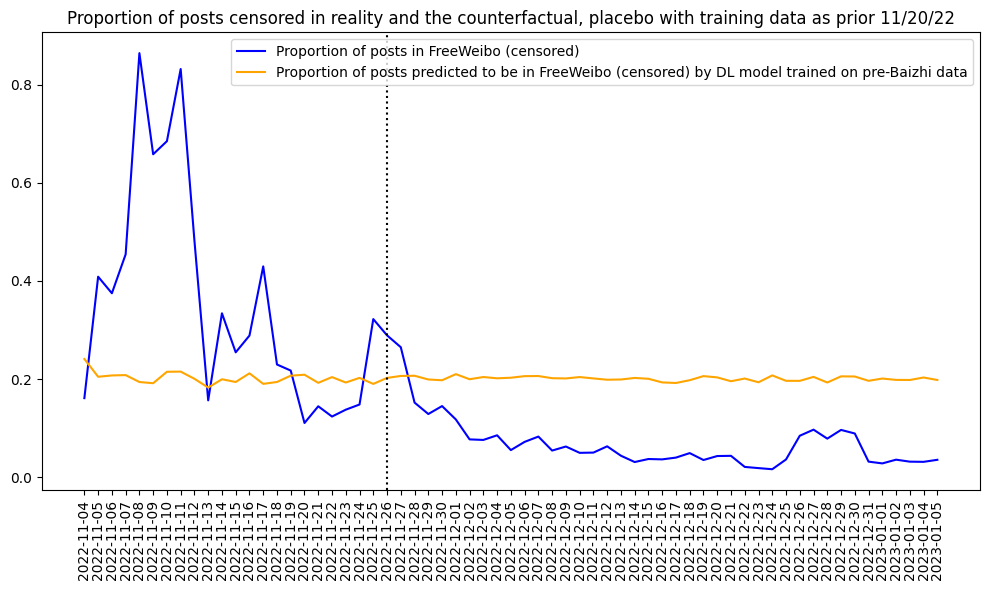

In [ ]:
import matplotlib.pyplot as plt
fig, ax = plt.subplots(figsize=(10, 6))
time_l = res['dt_date']
true_label_l = res['label_num']
pred_label_l = res['pred_label_num']
ax.plot(time_l, true_label_l, label='Proportion of posts in FreeWeibo (censored)', linestyle='solid', color='blue')
ax.plot(time_l, pred_label_l, label='Proportion of posts predicted to be in FreeWeibo (censored) by DL model trained on pre-Baizhi data', linestyle='solid', color='orange')
ax.set_xticks(time_l)
ax.set_xticklabels(time_l, rotation=90)
ax.axvline(x=time_l[22], color='black', linestyle='dotted')
#ax.set_ylim([0, 0.5])
ax.legend()

#ax.set_title('Proportion of posts censored in reality and the counterfactual')
ax.set_title('Proportion of posts censored in reality and the counterfactual, placebo with training data as prior 11/20/22')

plt.tight_layout()
plt.show()

In [ ]:
import matplotlib.pyplot as plt

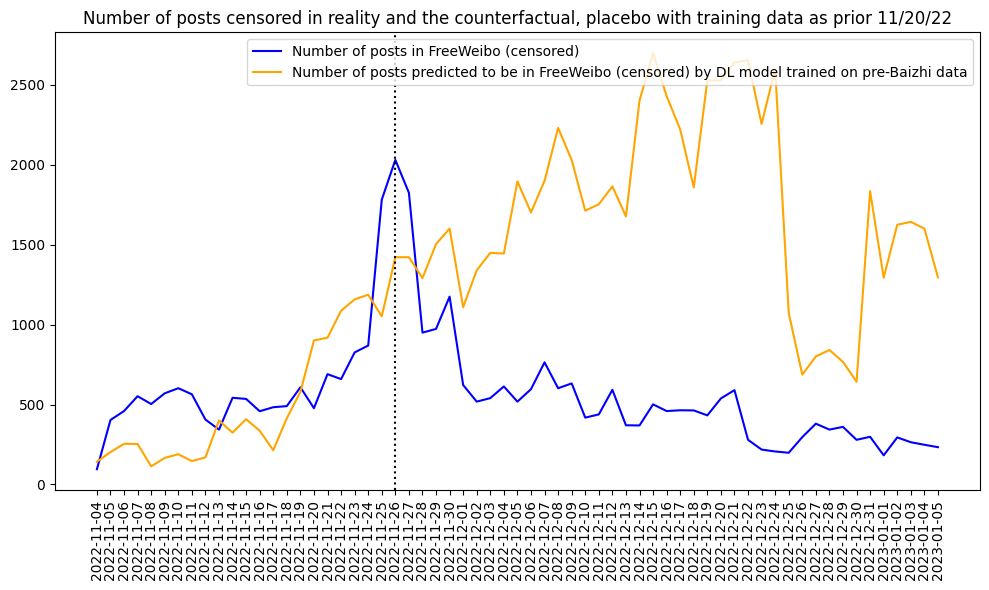

In [ ]:
fig, ax = plt.subplots(figsize=(10, 6))
time_l = res['dt_date']
true_label_l = res1.loc[res1['label_num']==1,0]
pred_label_l = res2.loc[res2['pred_label_num']==1,0]
ax.plot(time_l, true_label_l, label='Number of posts in FreeWeibo (censored)', linestyle='solid', color='blue')
ax.plot(time_l, pred_label_l, label='Number of posts predicted to be in FreeWeibo (censored) by DL model trained on pre-Baizhi data', linestyle='solid', color='orange')
ax.axvline(x=time_l[22], color='black', linestyle='dotted')

ax.set_xticks(time_l)
ax.set_xticklabels(time_l, rotation=90)
#ax.set_ylim([0, 0.5])
ax.legend()

#ax.set_title('Number of posts censored in reality and the counterfactual')
ax.set_title('Number of posts censored in reality and the counterfactual, placebo with training data as prior 11/20/22')

plt.tight_layout()
plt.show()

In [ ]:
res = df.groupby(['dt_date']).agg({'label_num':'sum',
                                    'pred_label_num':'sum'}).reset_index()
res

,dt_date,label_num,pred_label_num
0,2022-11-01,93,75
1,2022-11-02,90,70
2,2022-11-03,73,56
3,2022-11-04,95,73
4,2022-11-05,403,320
...,...,...,...
401,2023-12-07,267,215
402,2023-12-08,182,147
403,2023-12-09,163,126
404,2023-12-10,135,107


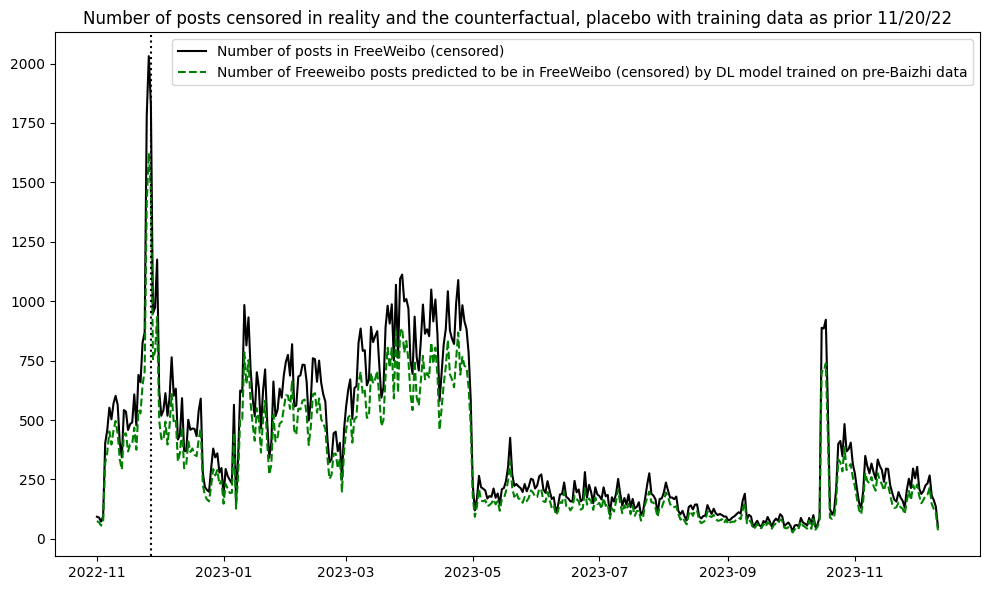

In [ ]:
fig, ax = plt.subplots(figsize=(10, 6))
time_l = res['dt_date']
true_label_l = res['label_num']
pred_label_l = res['pred_label_num']
ax.plot(time_l, true_label_l, label='Number of posts in FreeWeibo (censored)', linestyle='solid', color='black')
ax.plot(time_l, pred_label_l, label='Number of Freeweibo posts predicted to be in FreeWeibo (censored) by DL model trained on pre-Baizhi data', linestyle='dashed', color='green')
ax.axvline(x=time_l[26], color='black', linestyle='dotted')

#ax.set_xticks(time_l)
#ax.set_xticklabels(time_l, rotation=90)
#ax.set_ylim([0, 0.5])
ax.legend()

#ax.set_title('Number of posts censored in reality and the counterfactual')
ax.set_title('Number of posts censored in reality and the counterfactual, placebo with training data as prior 11/20/22')

plt.tight_layout()
plt.show()

In [ ]:
res1.columns = ['dt_date', 'true_label_num', 'freq_true_label']
res2.columns = ['dt_date', 'pred_label_num', 'freq_pred_label']

In [ ]:
res1.to_csv('/content/drive/MyDrive/prediction_plot_true.csv', encoding='utf-8')
res2.to_csv('/content/drive/MyDrive/prediction_plot_pred.csv', encoding='utf-8')

In [ ]:
res1 = pd.read_csv('/content/drive/MyDrive/prediction_plot_true.csv', encoding='utf-8')
res2 = pd.read_csv('/content/drive/MyDrive/prediction_plot_pred.csv', encoding='utf-8')

In [ ]:
import matplotlib.pyplot as plt

In [ ]:
time_l

0      2022-11-04
1      2022-11-04
2      2022-11-05
3      2022-11-05
4      2022-11-06
          ...    
121    2023-01-03
122    2023-01-04
123    2023-01-04
124    2023-01-05
125    2023-01-05
Name: dt_date, Length: 126, dtype: object

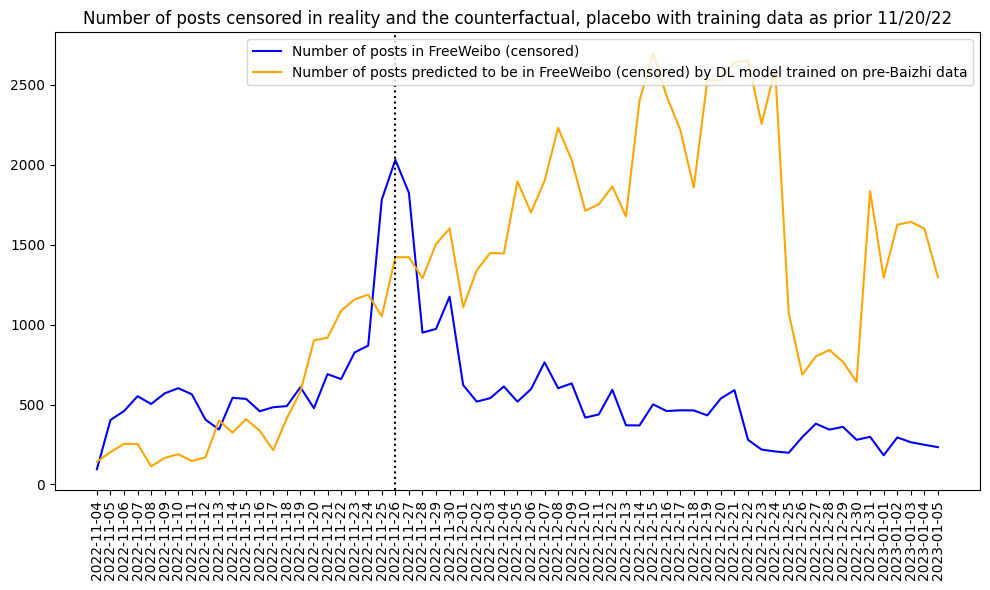

In [ ]:
fig, ax = plt.subplots(figsize=(10, 6))
time_l = res1['dt_date'].unique()
true_label_l = res1.loc[res1['true_label_num']==1,'freq_true_label']
pred_label_l = res2.loc[res2['pred_label_num']==1,'freq_pred_label']
ax.plot(time_l, true_label_l, label='Number of posts in FreeWeibo (censored)', linestyle='solid', color='blue')
ax.plot(time_l, pred_label_l, label='Number of posts predicted to be in FreeWeibo (censored) by DL model trained on pre-Baizhi data', linestyle='solid', color='orange')
ax.axvline(x=time_l[22], color='black', linestyle='dotted')

ax.set_xticks(time_l)
ax.set_xticklabels(time_l, rotation=90)
#ax.set_ylim([0, 0.5])
ax.legend()

#ax.set_title('Number of posts censored in reality and the counterfactual')
ax.set_title('Number of posts censored in reality and the counterfactual, placebo with training data as prior 11/20/22')

plt.tight_layout()
plt.show()

## Post hoc analysis: LASSO

In [ ]:
import gensim.corpora as corpora
import gensim
import jieba
df = pd.read_csv('/content/drive/MyDrive/weibo_freeweibo_with_predicted_label.csv', encoding='utf-8')
df.columns = ['Unnamed: 0', 'post', 'dt_date', 'pre_post_baizhi', 'label',
       'true_label_num', 'pred_label_num']
df2 = df.loc[(df['pred_label_num'] == df['true_label_num']), ['post', 'true_label_num']]

In [ ]:
## remove the "yi"'s since we get a lot of them in the jieba 分词
df2['post'] = df2['post'].apply(lambda x: re.sub('一', '', str(x)))

In [ ]:
df2['post'] = df2['post'].apply(lambda x: " ".join(jieba.cut(str(x), cut_all=False)))
df2['post_sep'] = df2['post'].apply(lambda x: x.split())

In [ ]:
from sklearn.feature_extraction.text import CountVectorizer

def dummy(doc):
    return doc

cv = CountVectorizer(
        tokenizer=dummy,
        preprocessor=dummy,
    )

In [ ]:
v_1 = cv.fit_transform(df2['post_sep'])
ll = v_1.sum(axis=0).tolist()[0]
ll_s = sorted(ll, reverse=True)[0:5000]
row_s = [ll.index(ll_s[x]) for x in range(5000)]
v_1_s = v_1[:, row_s]
td = pd.DataFrame(v_1_s.todense())
td.columns = cv.get_feature_names_out()[0:5000]

/usr/local/lib/python3.10/dist-packages/sklearn/feature_extraction/text.py:528: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn(


In [ ]:
x_train = td
y_train = df2['true_label_num']

In [ ]:
from sklearn.linear_model import LogisticRegression

log = LogisticRegression(penalty='l1', solver='liblinear')
log.fit(x_train, y_train)

res = pd.DataFrame({'word':td.columns,
                    'coef': log.coef_[0]})
res = res.sort_values(by=['coef'], ascending=False)

In [ ]:
pd.concat([res.iloc[0:200], res.iloc[-200:]]).to_csv('/content/drive/MyDrive/weibo_freeweibo_post_bert_keywords_mar6_24_v2.csv', encoding='utf-8', index=False)